# **Tutoriel No3**
### *Auteur*:TCHOTANEU NGATCHA Giresse*

## I- Preparation de l'environnement de travail 
### I-1-importation des bibiotheques utiles 

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

### I-2-visualisation de la video à segmenter 

In [2]:
# visualisation de la video
cap = cv.VideoCapture("video/1.mp4")
ret, frame = cap.read() 
if (cap.isOpened()== False):# Check if camera opened successfully
    print("erreur de lecture")
# demmarage de la lecture 
while(1): 
    ret, frame = cap.read() 
    # lecture frame par frame
    ret, frame = cap.read() 
    if ret == True:
        cv.imshow("prise de vue", frame) # afficher le frame courant 
    #arreter la visualisation 
    if cv.waitKey(25) & 0xFF == ord('q'): # apputer sur "q" pour sortir 
        break
    #sorti de la boucle lorsque la lecture ret = false 
    else:
        break

     #When everything done, release
    # the video capture object
cap.release()
cv.destroyAllWindows() # Closes all the frames


## II-  visualisation du flow  optique 

### II-1  flow optique (visualisation avec la norme )
#### Plus l'intensité lumineuse est élevée, plus la norme du déplacement est élevée (Plus l'objet bouge rapidement)

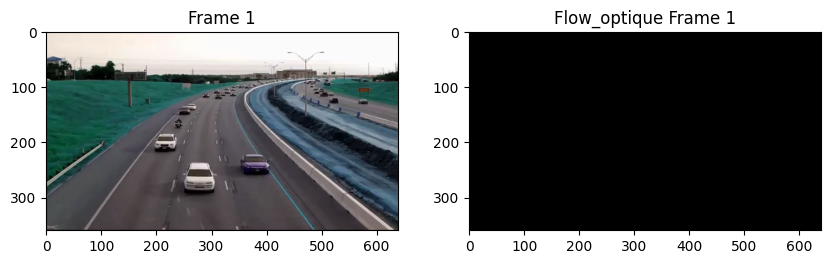

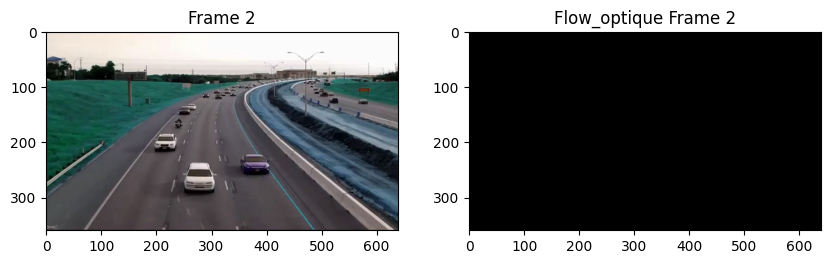

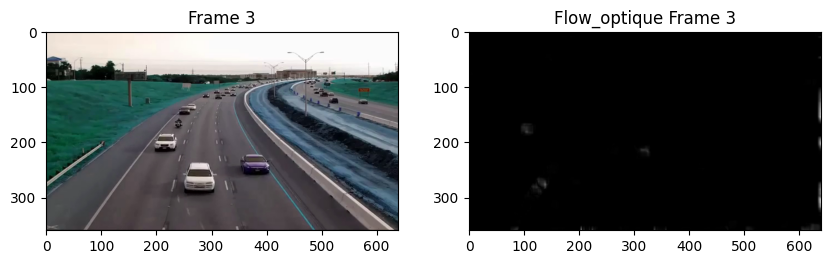

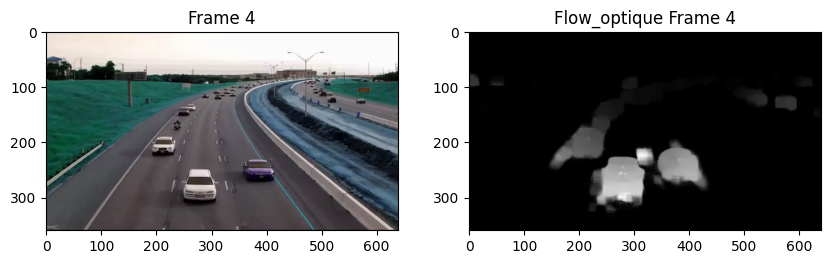

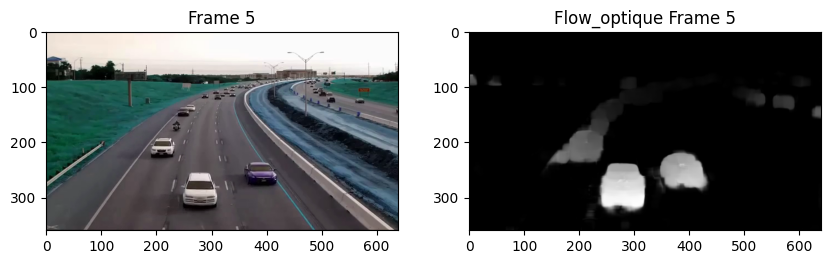

...

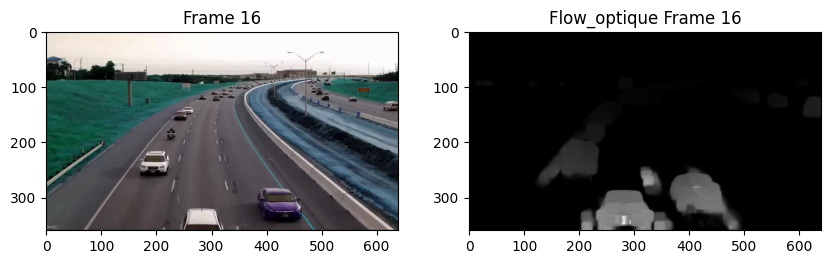

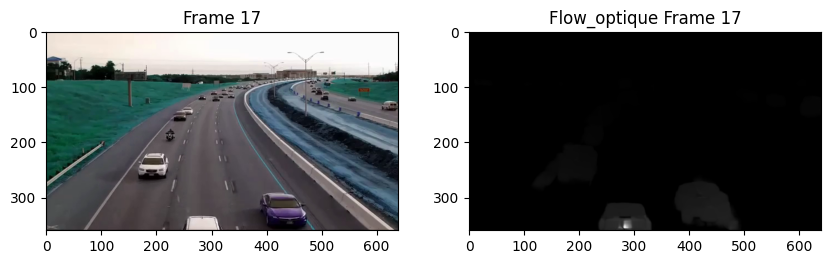

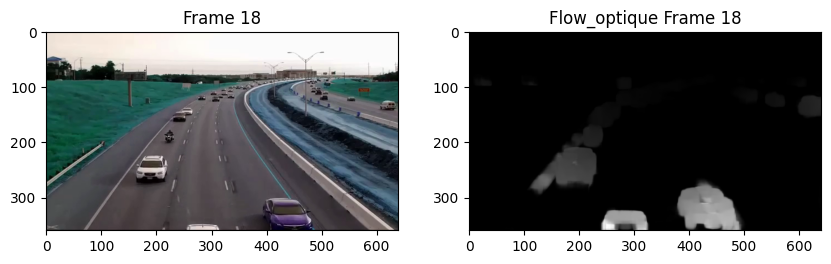

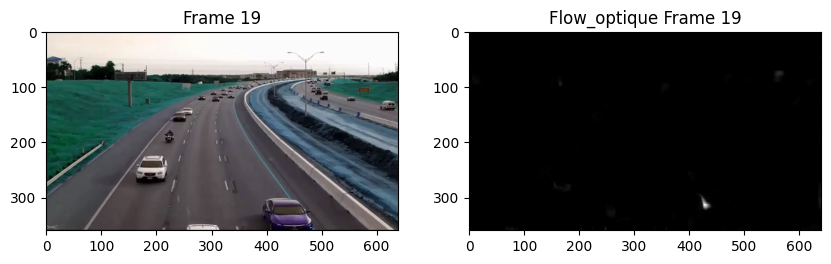

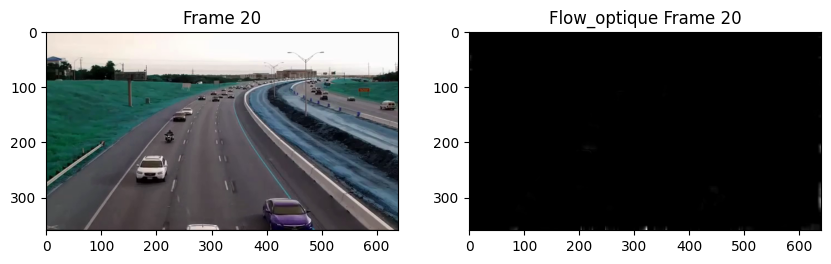

In [3]:
# initialisation des variables 
cap = cv.VideoCapture("video/1.mp4")                     # lecture de la video de test 
ret, frame1 = cap.read()                     # capture du premier frame de la sequence d'image 
prvs = cv.cvtColor(frame1,cv.COLOR_BGR2GRAY) # convertion de frame en niveau de gris 
tableau_hsv = np.zeros_like(frame1)                  # construction d'un tableau de meme taille que le frame de la video , ce tableau va nous permettre de construuire une image hsv 
tableau_hsv[...,0] = 0                               # mise a zero de tous les elements du  canal 1
tableau_hsv[...,1] = 0                               # mise a zero de tous les elements du  canal 2
indice_frame=1                                # lindice qui va nous permetttre de numorote les  frames et les flots optiques lors de l'affichage


# debut du traitement du du calcul du flot optique 

while(1):                                                    # cette valeur de 1  nous permet de debuter l'execution de  la boucle qans une condition 
    ret, frameCourant = cap.read()                                  # capture du deuxxieme frame de sequence d'image
    
    # verifier si le second frame est exitant car le flot optique a besoin de deux frames pour etre executer 
    if ret == False:                                          # si le deuxieme frame n'a pas ete chargé on sort directement de la boucle "while" 
        break                                
    next = cv.cvtColor(frameCourant,cv.COLOR_BGR2GRAY)               # conversion du second frame en niveau de gris 
    # calcule du flot optique entre ces deux frames . nous avons utiles les parametre par defaut du calcule du flow optique  
    cal_flot = cv.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.5, 1) # pour calculer le flow optique nous avons utilisés les parametres par defauts 
    # puisque nous voulions afficher le flow optique avec seulement la norme nous allons , nous allons recuperer seulement la norme 
    norme,_ = cv.cartToPolar(cal_flot[...,0], cal_flot[...,1])           # recuperation de la norme du flow optique 
    tableau_hsv[...,2] = cv.normalize(norme,None,0,255,cv.NORM_MINMAX)   # normalisation des norme de pixel entrre les valeur [0..255] puisque nous voulions obtenir une image hsv 
    # comme nous avons obtenir une image hsv grace a la normalisation des vitesse de pixel , il nous suffit de convertir dans un espace colometrie bgr pour affichage  
    flowOptiqueCourant  = cv.cvtColor(tableau_hsv,cv.COLOR_HSV2BGR)                    # conversion de l'image dans l'espace bgr  pour affichage 
    
    # affichage du flot aptique dans dan sune fenetre 

    fusion_imagehorizontal = np.hstack((frameCourant,flowOptiqueCourant))         # concatennation  du frame et du flot optique 
    cv.imshow("flow optique dense a droite de la video uniquement avec la norme ", fusion_imagehorizontal) # affichage  de l'image concatener ou du frame et de son flot optique 

    # condition d'arret du programme  
    
    if cv.waitKey(1) & 0xFF == ord('q'): # si vous appuyer sur la touche q de votre clavier. noter que le q doit etre en minuscule don verifier si la touche majuscule est activé 
        break 
    if indice_frame==21 :               # le programme peut s'arrete automatique lorsqu'il a deja afficher 20 frame et leur flow optique coorrespondante 
         break
            
    prvs = next        # le frame suivant devient le frame precedent pour pourvoir cantinue a calcule de maniere continie les aautre flow optique des autres frames 

    plt.figure(figsize=(10,10))    # taille d'affiche de l'image 
    plt.subplot(1,2,1)               # position de l'affichage de l'image frame2
    plt.imshow(frameCourant)            # affichage du frame en cours 
    plt.title("Frame " + str(indice_frame)) # titre de l'image affiché  
    plt.subplot(1,2,2)    # position de l"affichage de l"image du flow optique  calcule à partir du frame courant 
    plt.imshow(flowOptiqueCourant )  #affichage u flot optique de des frame courant 
    plt.title("Flow_optique Frame "+ str(indice_frame))   # titre du flow optique courant    
    plt.show()
    indice_frame=indice_frame+1    # incrementation de l'indice du frame pour pouvoir controle le nombre de frame à afficher 
cap.release()                    # on libere la ressource 
cv.destroyAllWindows() # permet  de détruire ou de fermer toutes les fenêtres à tout moment après avoir quitté le programmme 


### II.2. Flow optique en utilisant la norme et  l'orientation 
##### La couleur correspond à l'orientation du deplacement de l'objet 

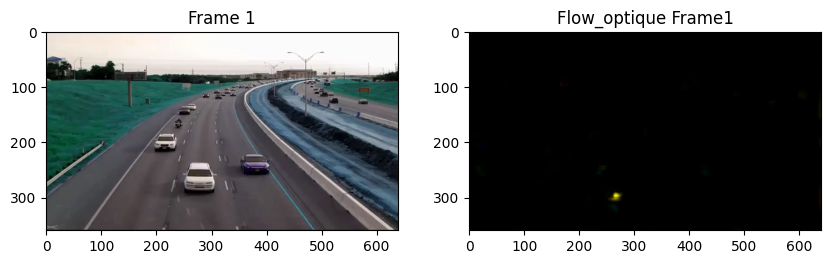

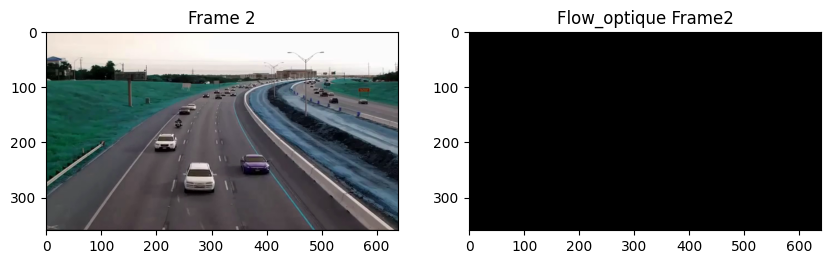

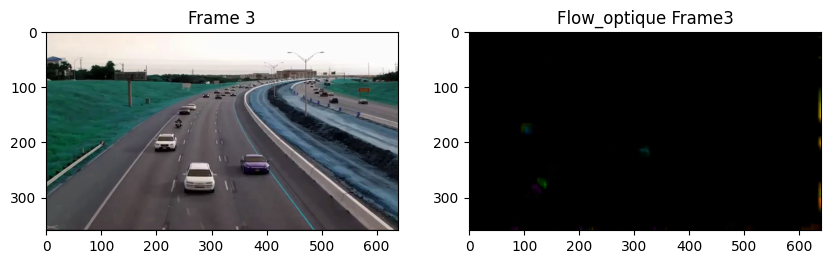

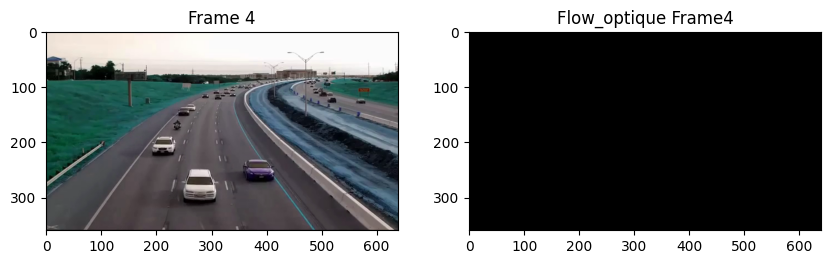

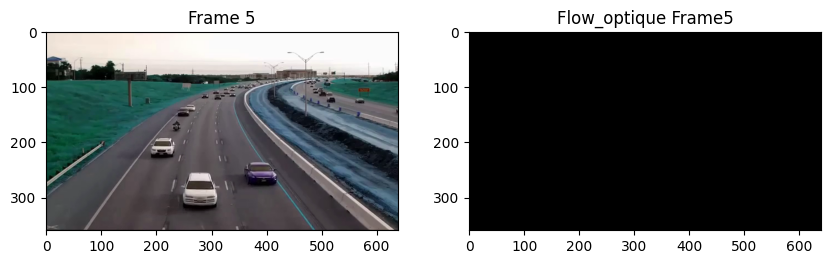

...

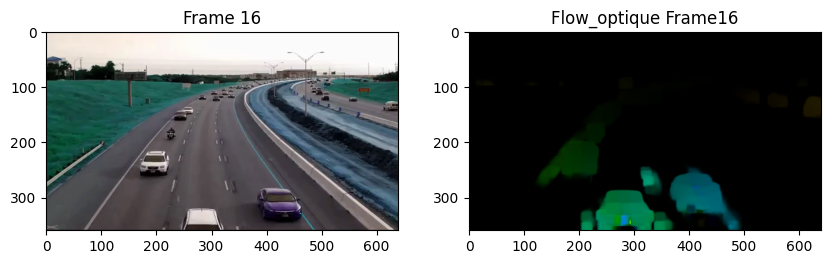

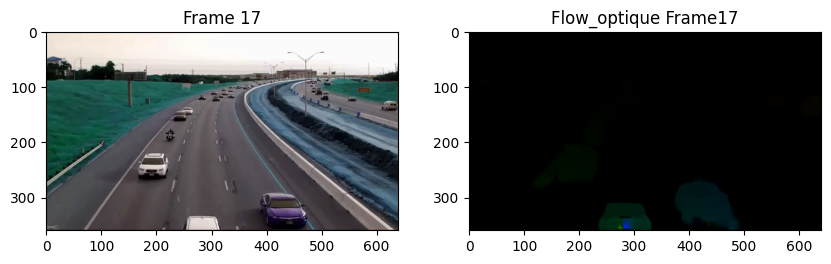

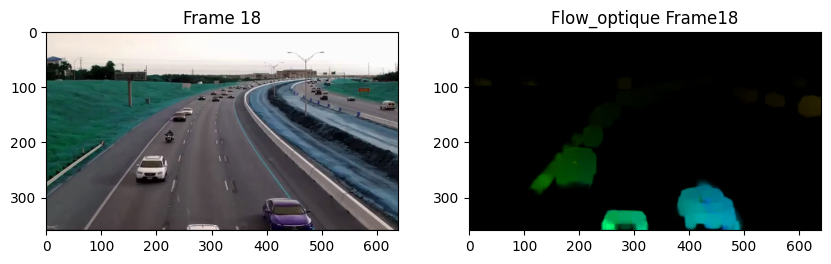

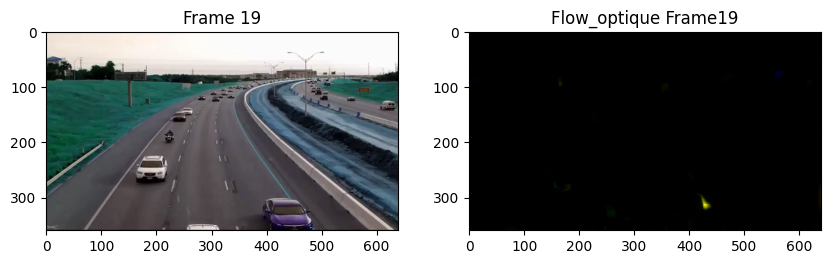

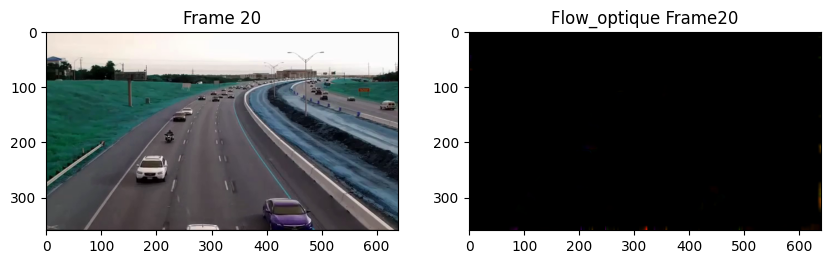

In [4]:
# initialisation des variables 
cap1 = cv.VideoCapture("video/1.mp4")       # lecture de la video pour le test de l'experience 
ret, frame1 = cap1.read()                     # capture du premier frame de la sequence d'image 
prvs = cv.cvtColor(frame1,cv.COLOR_BGR2GRAY) # convertion de frame en niveau de gris 
tableau_hsv = np.zeros_like(frame1)                  # construction d'un tableau de meme taille que le frame de la video , ce tableau va nous permettre de construuire une image hsv 
tableau_hsv[...,1] = 255   # on fixe le canal 2 du tableau avec  les valeur 255 en effet dans l'espace hsv cette espace est consider comme la saturation ce qu permettra de mieux apprecier la couler de donner par la valeur de l'angle 
indice_frame=1                               # lindice qui va nous permetttre de numeroter les  frames et les flots optiques lors de l'affichage


# debut du traitement du du calcul du flot optique 

while(1):                                                    # cette valeur de 1  nous permet de debuter l'execution de  la boucle qans une condition 
    ret, frameCourant = cap1.read()                                  # capture du deuxxieme frame de sequence d'image
    
    # verifier si le second frame est exitant car le flot optique a besoin de deux frames pour etre executer 
    if ret == False:                                          # si le deuxieme frame n'a pas ete chargé on sort directement de la boucle "while" 
        break                                
    next = cv.cvtColor(frameCourant,cv.COLOR_BGR2GRAY)               # conversion du second frame en niveau de gris 
    # calcule du flot optique entre ces deux frames . nous avons utiles les parametre par defaut du calcule du flow optique  
    cal_flot = cv.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.5, 1) # pour calculer le flow optique nous avons utilisés les parametres par defauts 
    # puisque nous voulions afficher le flow optique avec seulement la norme nous allons , nous allons recuperer seulement la norme 
    norme,orientation = cv.cartToPolar(cal_flot[...,0],cal_flot[...,1])         # recuperation  des deux composante du flow optique : la norme (vitesse ) et l'orientation (l'angle)
    tableau_hsv[...,0] = orientation*180/np.pi/2                               #on charge les valeurs des angles dans le canal 1 du tableau en effet les teinte dans l'espace hsv est une valeur angulaire en degre 
    tableau_hsv[...,2] = cv.normalize(norme,None,0,255,cv.NORM_MINMAX)   # normalisation des norme de pixel entrre les valeur [0..255] puisque nous voulions obtenir une image hsv 
    # comme nous avons obtenir une image hsv grace a la normalisation des vitesse de pixel , il nous suffit de convertir dans un espace colometrie bgr pour affichage  
    flowOptiqueCourant = cv.cvtColor(tableau_hsv,cv.COLOR_HSV2BGR)                    # conversion de l'image dans l'espace bgr  pour affichage 
    
    # affichage du flot aptique dans dan sune fenetre 

    fusion_imagehorizontal = np.hstack((frameCourant, flowOptiqueCourant))         # concatennation  du frame et du flot optique 
    cv.imshow("flow optique dense a droite de la video norme et orientation  ", fusion_imagehorizontal) # affichage  de l'image concatener ou du frame et de son flot optique 

    # condition d'arret du programme  
    
    if cv.waitKey(1) & 0xFF == ord('q'): # si vous appuyer sur la touche q de votre clavier. noter que le q doit etre en minuscule don verifier si la touche majuscule est activé 
        break 
    if indice_frame==21 :               # le programme peut s'arrete automatique lorsqu'il a deja afficher 20 frame et leur flow optique coorrespondante 
         break
            
    prvs = next        # le frame suivant devient le frame precedent pour pourvoir cantinue a calcule de maniere continie les aautre flow optique des autres frames 

    plt.figure(figsize=(10,10))    # taille d'affiche de l'image 
    plt.subplot(1,2,1)               # position de l'affichage de l'image frame2
    plt.imshow(frameCourant)            # affichage du frame en cours 
    plt.title("Frame " + str(indice_frame)) # titre de l'image affiché  
    plt.subplot(1,2,2)    # position de l"affichage de l"image du flow optique  calcule à partir du frame courant 
    plt.imshow(flowOptiqueCourant)  #affichage u flot optique de des frame courant 
    plt.title("Flow_optique Frame"+ str(indice_frame))   # titre du flow optique courant    
    plt.show()
    indice_frame=indice_frame+1    # incrementation de l'indice du frame pour pouvoir controle le nombre de frame à afficher 
cap1.release()                    # on libere la ressource 
cv.destroyAllWindows() # permet  de détruire ou de fermer toutes les fenêtres à tout moment après avoir quitté le programmme 






# II -la segmentation par seuillage 

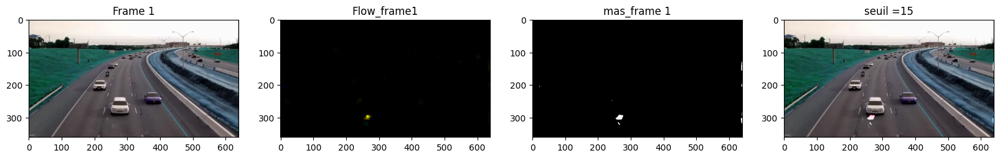

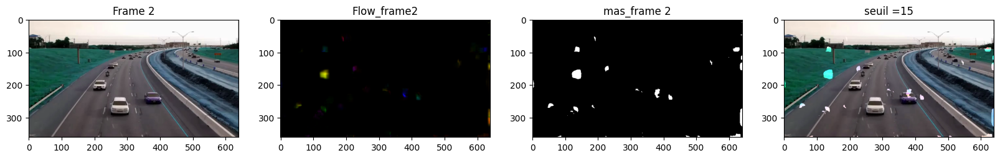

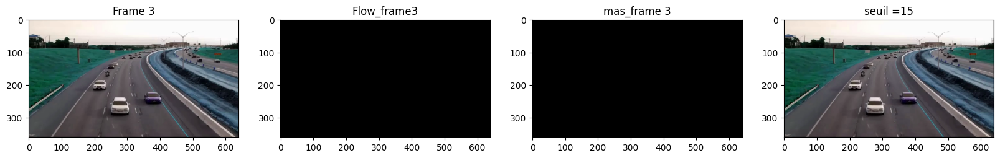

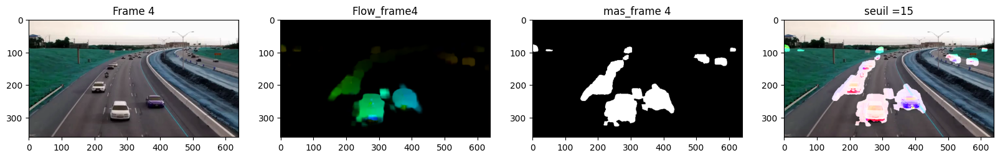

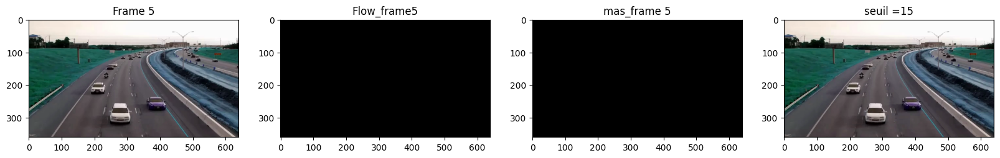

...

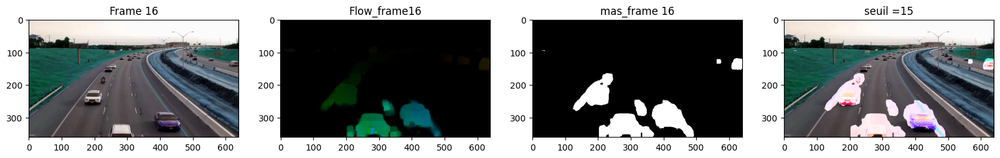

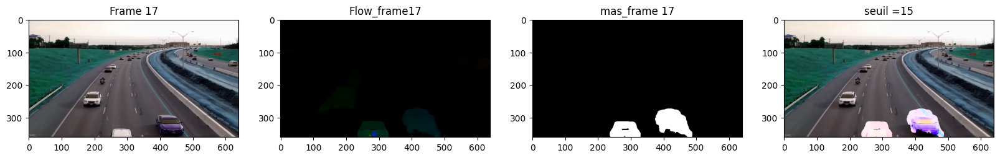

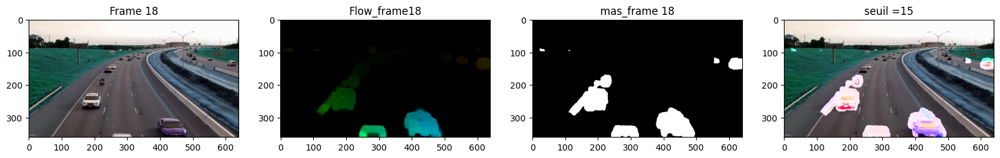

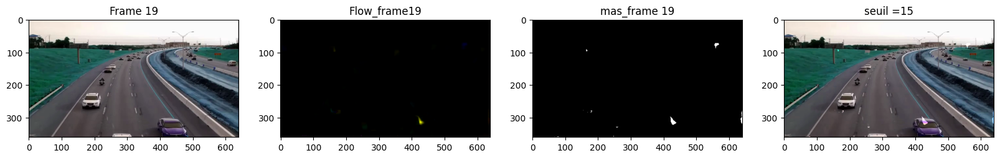

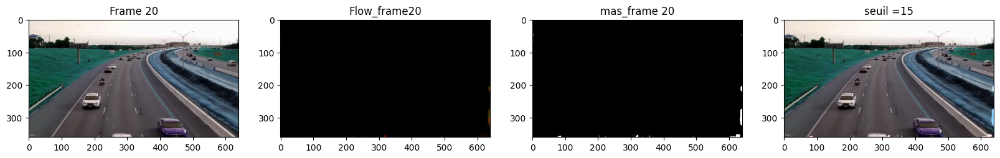

In [5]:
# initialisation des variables 
cap2 = cv.VideoCapture("video/1.mp4")       # lecture de la video pour le test de l'experience 
ret, frame1 = cap2.read()                     # capture du premier frame de la sequence d'image 
shape = (frame1.shape[1], frame1.shape[0])
prvs = cv.cvtColor(frame1,cv.COLOR_BGR2GRAY) # convertion de frame en niveau de gris 
tableau_hsv= np.zeros_like(frame1)                  # construction d'un tableau de meme taille que le frame de la video , ce tableau va nous permettre de construuire une image hsv 
tableau_hsv[...,1] = 255            # on fixe le canal 2 du tableau avec  les valeur 255 en effet dans l'espace hsv cette espace est consider comme la saturation ce qu permettra de mieux apprecier la couler de donner par la valeur de l'angle 
indice_frame=1                               # l'indice qui va nous permetttre de numeroter les  frames et les flots optiques lors de l'affichage et aussi de controle le nonbre de frame à afficher 
seuil = 15                   # seuil de segmentation de la norme (vitesse) , les on considera uniquement les objets dons les pixel on une norme superieur ou egale à 50 
filtre = np.ones((3,3),np.uint8)  # Noyau de pour effectuer les operation de morphologique (ouverture et fermeture)

indice_frame=1

while(1):
    
    ret, frameCourant = cap2.read()                                  # capture du deuxxieme frame de sequence d'image
    
    # verifier si le second frame est exitant car le flot optique a besoin de deux frames pour etre executer 
    if ret == False:                                          # si le deuxieme frame n'a pas ete chargé on sort directement de la boucle "while" 
        break                                
    next = cv.cvtColor(frameCourant,cv.COLOR_BGR2GRAY)               # conversion du second frame en niveau de gris 
    # calcule du flot optique entre ces deux frames . nous avons utiles les parametre par defaut du calcule du flow optique  
    cal_flot = cv.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.5, 1) # pour calculer le flow optique nous avons utilisés les parametres par defauts 
    # puisque nous voulions afficher le flow optique avec seulement la norme nous allons , nous allons recuperer seulement la norme 
    norme,orientation = cv.cartToPolar(cal_flot[...,0],cal_flot[...,1])         # recuperation  des deux composante du flow optique : la norme (vitesse ) et l'orientation (l'angle)
    tableau_hsv[...,0] = orientation*180/np.pi/2                               #on charge les valeurs des angles dans le canal 1 du tableau en effet les teinte dans l'espace hsv est une valeur angulaire en degre  
    tableau_hsv[...,2] = cv.normalize(norme,None,0,255,cv.NORM_MINMAX)   # normalisation des norme de pixel entrre les valeur [0..255] puisque nous voulions obtenir une image hsv 
    # comme nous avons obtenir une image hsv grace a la normalisation des vitesse de pixel , il nous suffit de convertir dans un espace colometrie bgr pour affichage  
    flowOptiqueCourant = cv.cvtColor(tableau_hsv,cv.COLOR_HSV2BGR)                    # conversion de l'image dans l'espace bgr  pour affichage 

    # construction du masque pour effectuer la segmentation 
    ret, masque= cv.threshold(tableau_hsv[...,2],seuil,255,cv.THRESH_BINARY) # le masque sera une image binaire  tout les pixels superieur au seuil prendront la couleur blanche(255)
                                                                             #et celle inferieur au seuil prendront la couleur noir(0)
    ret, masque2= cv.threshold(tableau_hsv[...,2],seuil,255,cv.THRESH_BINARY)   
    # definition de l'operation d'ouverture sur le masque en fait c'est la combinaison d'une operation d'erosion suivie d'une operation de dilatation 
    # operation d'erotion perd'erosion suivie d'une operation de dilatation 
    #fermeture = cv.morphologyEx(masque, cv.MORPH_OPEN, filtre)         #  Il est utile pour supprimer le bruit c'est les pixel qui seront isolés d'un groupes de pixels , car nous 
    fermeture = cv.erode ( masque, filtre,30)                                             # car nous avons pris comme hypothese que les pixel d'un meme objet doivent bloc homogene qui se deplacent avec la memes vitesse 
    # definition de l'operation fermeture qui est un peu le contraire de l'auverture c'est on fair une dilatation ensuite une erosion  
    #fermeture  = cv.morphologyEx(ouverture, cv.MORPH_CLOSE, filtre)     # comme nous avons pris comme hypothese que les pixels forment  un groupe homogene il faut  fermer les eventuelles trou qui peuvent se trouvent dans le blocs de pixel 
    
    
    # Segmentation des objets sur  l'image originale en fonction des seuil definie  
    frameCourantSeg = cv.cvtColor(frameCourant, cv.COLOR_BGR2HSV) # on effectue une copie du frame courant  

    frameCourantSeg[...,2] = np.array([255 if value==255 else frameCourantSeg[...,2].reshape(shape[0]*shape[1])[index] for  #  on va colorer en blanc les points correspondant au masque dans l'image du frame courant 
                                        index, value in enumerate(fermeture.reshape(shape[0]*shape[1]))]).reshape(shape[1], shape[0])
    frameCourantSeg = cv.cvtColor(frameCourantSeg, cv.COLOR_HSV2BGR) # on convertir le frame courant segmenter pour un meilleur affichage
    
    # Masque
    masque = cv.cvtColor(fermeture, cv.COLOR_GRAY2BGR)
    
    montage = np.concatenate((frameCourant,flowOptiqueCourant), axis=1)
    
    cv.imshow('segmentation_seuil='+ str(seuil),montage)
    
   # condition d'arret du programme  
    
    if cv.waitKey(1) & 0xFF == ord('q'):        # si vous appuyer sur la touche q de votre clavier. noter que le q doit etre en minuscule don verifier si la touche majuscule est activé 
        break 
    if indice_frame==21 :                       # le programme peut s'arrete automatique lorsqu'il a deja afficher 20 frame et leur flow optique coorrespondante 
         break
    prvs = next                                 # le frame suivant devient le frame precedent pour pourvoir cantinue a calcule de maniere continie les aautre flow optique des autres frames 

    plt.figure(figsize=(20,20))                  # taille d'affiche de l'image 
    plt.subplot(1,4,1)                           # position de l'affichage de l'image frame2 ( premiere ligne,  premier colonne )
    plt.imshow(frameCourant)                           # affichage du frame en cours 
    plt.title("Frame " + str(indice_frame))      # titre de l'image affiché  
    plt.subplot(1,4,2)                           # position de l"affichage de l"image du flow optique  calcule à partir du frame courant ( premiere ligne, deuxieme colonne )
    plt.imshow(flowOptiqueCourant)                #affichage du flot optique de des frame courant 
    plt.title("Flow_frame"+ str(indice_frame))   # titre du flow optique courant  
    plt.subplot(1,4,3)                           # position de l"affichage de l"image du flow optique  calcule à partir du frame courant  ( premiere ligne,  troixieme  colonne )
    plt.imshow(masque)                           # affichage du masque qui a permit de faire la segmentation dans le frame courant  
    plt.title("mas_frame " + str(indice_frame))  # titre de la fenetre contenant le masque 
    plt.subplot(1,4,4)                            # position de ffichage de la segmentation des objets dans le frame courant  ( premiere ligne, quatrieme colonne )
    plt.imshow(frameCourantSeg)                        # affichage de la segmentation des objets dans le frame courant
    plt.title("seuil =" + str(seuil))             # titre de la fenetre dae la segmentation 
    plt.show()
    indice_frame=indice_frame+1                    # incrementation de l'indice du frame pour pouvoir controle le nombre de frame à afficher 
cap2.release()                                      # on libere la ressource 
cv.destroyAllWindows()                             # permet  de détruire ou de fermer toutes les fenêtres à tout moment après avoir quitté le programmme 

# III la segmentation avec kmeans 

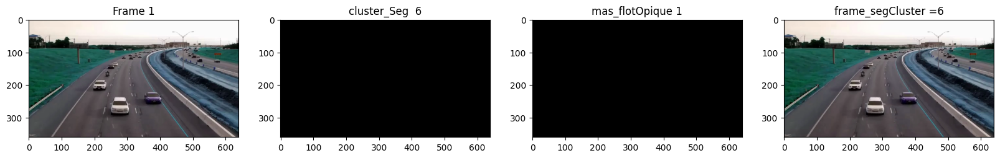

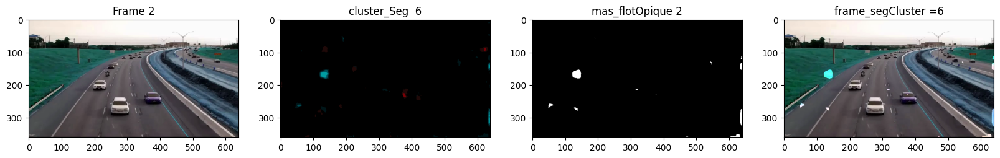

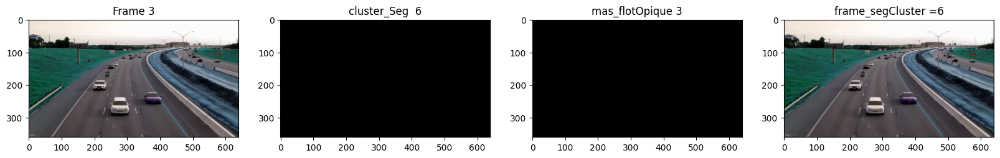

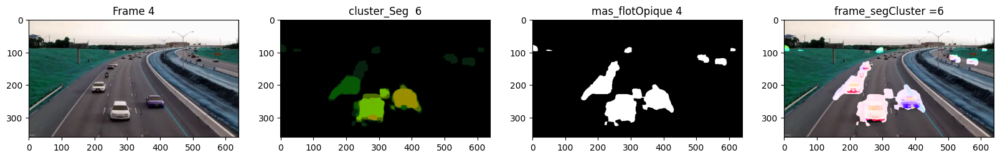

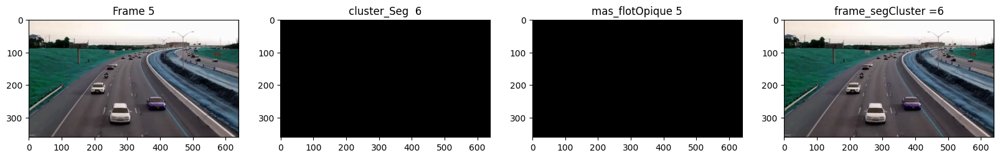

...

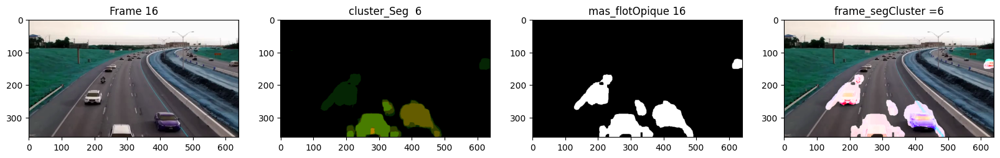

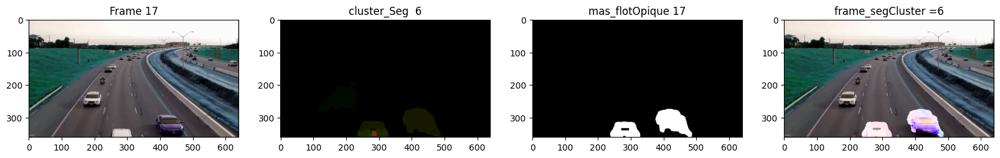

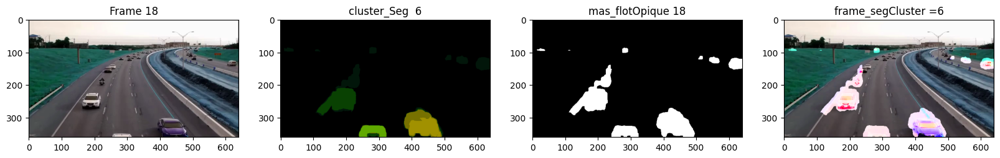

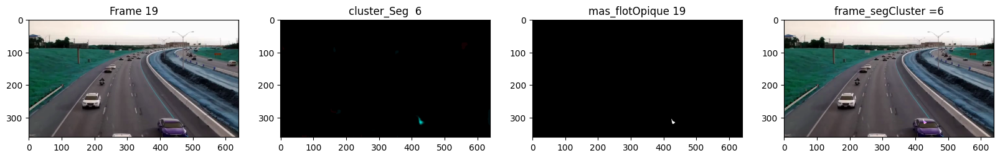

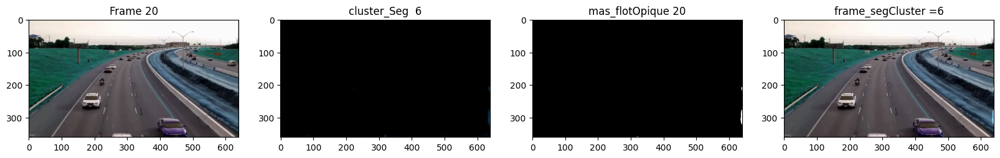

In [6]:

# initialisation des variables 
cap = cv.VideoCapture("video/1.mp4")       # lecture de la video pour le test de l'experience 
ret, frame1 = cap.read()                     # capture du premier frame de la sequence d'image 
shape = (frame1.shape[1], frame1.shape[0])
prvs = cv.cvtColor(frame1,cv.COLOR_BGR2GRAY) # convertion de frame en niveau de gris 
tableau_hsv= np.zeros_like(frame1)                  # construction d'un tableau de meme taille que le frame de la video , ce tableau va nous permettre de construuire une image hsv 
tableau_hsv[...,1] = 255            # on fixe le canal 2 du tableau avec  les valeur 255 en effet dans l'espace hsv cette espace est consider comme la saturation ce qu permettra de mieux apprecier la couler de donner par la valeur de l'angle 
indice_frame=1                               # l'indice qui va nous permetttre de numeroter les  frames et les flots optiques lors de l'affichage et aussi de controle le nonbre de frame à afficher 
seuil = 15                     # seuil pou la binairisation du masque apres avoir effectue le clustering 
k = 6                                                  # definir le nombre de cluster 
filtre = np.ones((5,5),np.uint8)  # Noyau de pour effectuer les operation de morphologique (ouverture et fermeture)

indice_frame=1

while(1):
    
    ret, frameCourant = cap.read()                                  # capture du deuxxieme frame de sequence d'image
    
    # verifier si le second frame est exitant car le flot optique a besoin de deux frames pour etre executer 
    if ret == False:                                          # si le deuxieme frame n'a pas ete chargé on sort directement de la boucle "while" 
        break                                
    next = cv.cvtColor(frameCourant,cv.COLOR_BGR2GRAY)               # conversion du second frame en niveau de gris 
    # calcule du flot optique entre ces deux frames . nous avons utiles les parametre par defaut du calcule du flow optique  
    cal_flot = cv.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.5, 1) # pour calculer le flow optique nous avons utilisés les parametres par defauts 
    # puisque nous voulions afficher le flow optique avec seulement la norme nous allons , nous allons recuperer seulement la norme 
    norme,orientation = cv.cartToPolar(cal_flot[...,0],cal_flot[...,1])         # recuperation  des deux composante du flow optique : la norme (vitesse ) et l'orientation (l'angle)
    tableau_hsv[...,0] = orientation*180/np.pi/2                               #on charge les valeurs des angles dans le canal 1 du tableau en effet les teinte dans l'espace hsv est une valeur angulaire en degre  
    tableau_hsv[...,2] = cv.normalize(norme,None,0,255,cv.NORM_MINMAX)   # normalisation des norme de pixel entrre les valeur [0..255] puisque nous voulions obtenir une image hsv 
    # comme nous avons obtenir une image hsv grace a la normalisation des vitesse de pixel , il nous suffit de convertir dans un espace colometrie bgr pour affichage  
    flowOptiqueCourant = cv.cvtColor(tableau_hsv,cv.COLOR_HSV2BGR)                    # conversion de l'image dans l'espace bgr  pour affichage 

    # construction du masque pour effectuer la segmentation 
    copie_flowOptiqueCourant=flowOptiqueCourant  # nous faisons une copie du flow optique en cours , à partir de la nous alos determiner les clusters 
      #algorithe de kmeans pour determiner les cluster   
        # convert to RGB
    flow_RVB = cv.cvtColor(copie_flowOptiqueCourant, cv.COLOR_BGR2RGB) # nous concertisons l'image en rgb
    pixel_values = flow_RVB.reshape((-1, 3))           #  on mes l'ensemble des pixel dans le plan dans un tableau a deux dimension
    pixel_values = np.float32(pixel_values)           # converti les valeurs des pixel en reel 
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 100, 0.2) # definition des criteres d'arret de de la formation des clusters 
    _, labels, (centers) = cv.kmeans(pixel_values, k, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)
    centers = np.uint8(centers)                          # reconvertion des pixels en  valeur entier 
    labels = labels.flatten()                            # flatten the labels array
    flowOptique_cluster = centers[labels.flatten()]           # convertir les pixel au couleur des centroides 
    flowOptique_cluster = flowOptique_cluster.reshape(flow_RVB.shape) # reshape back to the original image dimension   
      #conversion 
    flowOptique_clusterCopie =cv.cvtColor(copie_flowOptiqueCourant, cv.COLOR_BGR2RGB)
    flowOptique_clusterCopie=  cv.cvtColor(flowOptique_cluster,cv.COLOR_BGR2GRAY) 
    ret, flowOptique_clusterCopie= cv.threshold(flowOptique_clusterCopie,seuil,255,cv.THRESH_BINARY)           
               
    # definition de l'operation d'ouverture sur le masque en fait c'est la combinaison d'une operation d'erosion suivie d'une operation de dilatation 
    # operation d'erotion perd'erosion suivie d'une operation de dilatation 
    #fermeture = cv.morphologyEx(masque, cv.MORPH_OPEN, filtre)         #  Il est utile pour supprimer le bruit c'est les pixel qui seront isolés d'un groupes de pixels , car nous 
    fermeture = cv.erode (flowOptique_clusterCopie, filtre,30)                                             # car nous avons pris comme hypothese que les pixel d'un meme objet doivent bloc homogene qui se deplacent avec la memes vitesse 
    # definition de l'operation fermeture qui est un peu le contraire de l'auverture c'est on fair une dilatation ensuite une erosion  
    #fermeture  = cv.morphologyEx(ouverture, cv.MORPH_CLOSE, filtre)     # comme nous avons pris comme hypothese que les pixels forment  un groupe homogene il faut  fermer les eventuelles trou qui peuvent se trouvent dans le blocs de pixel 
    
    
    # Segmentation des objets sur  l'image originale en fonction du masque obtenir par la methode de Kmeans    
    frameCourantSeg = cv.cvtColor(frameCourant, cv.COLOR_BGR2HSV) # on effectue une copie du frame courant  

    frameCourantSeg[...,2] = np.array([255 if value==255 else frameCourantSeg[...,2].reshape(shape[0]*shape[1])[index] for  #  on va colorer en blanc les points correspondant au masque dans l'image du frame courant 
                                        index, value in enumerate(fermeture.reshape(shape[0]*shape[1]))]).reshape(shape[1], shape[0])
    frameCourantSeg = cv.cvtColor(frameCourantSeg, cv.COLOR_HSV2BGR) # on convertir le frame courant segmenter pour un meilleur affichage
    
    # Masque
    masque = cv.cvtColor(fermeture, cv.COLOR_GRAY2BGR)
    
    montage = np.concatenate((frameCourant,flowOptiqueCourant), axis=1)
    
    cv.imshow('segmentation_seuil='+ str(seuil),montage)
    
   # condition d'arret du programme  
    
    if cv.waitKey(1) & 0xFF == ord('q'):        # si vous appuyer sur la touche q de votre clavier. noter que le q doit etre en minuscule don verifier si la touche majuscule est activé 
        break 
    if indice_frame==21 :                       # le programme peut s'arrete automatique lorsqu'il a deja afficher 20 frame et leur flow optique coorrespondante 
         break
    prvs = next                                 # le frame suivant devient le frame precedent pour pourvoir cantinue a calcule de maniere continie les aautre flow optique des autres frames 

    plt.figure(figsize=(20,20))                  # taille d'affiche de l'image 
    plt.subplot(1,4,1)                           # position de l'affichage de l'image frame2 ( premiere ligne,  premier colonne )
    plt.imshow(frameCourant)                     # affichage du frame en cours 
    plt.title("Frame " + str(indice_frame))      # titre de l'image affiché  
    #plt.subplot(1,5,2)                           # position de l"affichage de l"image du flow optique  calcule à partir du frame courant ( premiere ligne, deuxieme colonne )
    #plt.imshow(flowOptiqueCourant)               #affichage du flot optique  des frame courant 
   # plt.title("Flow_frame"+ str(indice_frame))   # titre du flow optique courant
    plt.subplot(1,4,2)                           # position de l"affichage des cluster de flow optique  calcule à partir du flow optique  ( premiere ligne,  troixieme  colonne )
    plt.imshow(flowOptique_cluster)              # affichage des differents clusters de flow optique du frame courant  
    plt.title("cluster_Seg  " + str(k))  # titre de la fenetre du cluster de flow optique du frame courant 
    plt.subplot(1,4,3)                           # position de l"affichage de l"image du flow optique  calcule à partir du frame courant  ( premiere ligne,  quatrieme  colonne )
    plt.imshow(masque)                           # affichage du masque qui a permit de faire la segmentation dans le frame courant  
    plt.title("mas_flotOpique " + str(indice_frame))  # titre de la fenetre contenant le masque 
    plt.subplot(1,4,4)                            # position de ffichage de la segmentation des objets dans le frame courant  ( premiere ligne, cinquieme colonne )
    plt.imshow(frameCourantSeg)                        # affichage de la segmentation des objets dans le frame courant
    plt.title("frame_segCluster =" + str(k))             # titre de la fenetre dae la segmentation 
    plt.show()
    indice_frame=indice_frame+1                    # incrementation de l'indice du frame pour pouvoir controle le nombre de frame à afficher 
cap.release()                                      # on libere la ressource 
cv.destroyAllWindows()                             # permet  de détruire ou de fermer toutes les fenêtres à tout moment après avoir quitté le programmme 